In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib as mpl
from scipy.stats import kstest
from IPython.core.display import HTML

In [3]:
'''
# For those who use black thema in Jupyter
mpl.rcParams['figure.facecolor'] = '0.065'
'''

# centering output plots
HTML("""
<style>
.jp-RenderedImage {
    display: table-cell;
    text-align: center;
    margin: auto;
}
.prompt 
    display:none;
}  
</style>
""")

In [4]:
data = pd.read_csv("data.csv")
enc_data = pd.read_csv("encoded_data.csv")

In [5]:
enc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customerID                               7043 non-null   object 
 1   gender                                   7043 non-null   float64
 2   SeniorCitizen                            7043 non-null   float64
 3   Partner                                  7043 non-null   float64
 4   Dependents                               7043 non-null   float64
 5   tenure                                   7043 non-null   float64
 6   PhoneService                             7043 non-null   float64
 7   MultipleLines                            7043 non-null   float64
 8   OnlineSecurity                           7043 non-null   float64
 9   OnlineBackup                             7043 non-null   float64
 10  DeviceProtection                         7043 no

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


# EDA

Let's make a little (or not little :) research in our data. We have only 3 not-categorical features: tenure, MonthCharges and TotalCharges. All other feature were either categorical or binary and after encoding all of them become binary.

This file is going to be large. So here is the links on each step in it

<ol>
  <li><a href="#churn-distribution">Visualization of Churn distribution</a>
  <li><a href="#analysing-non-categorical-data">Analysing non-categorical data</a>
    <ul>
      <li><a href="#non-categorical-histograms">Histograms of MonthCharges, tenure and TotalCharges</a></li>
      <li><a href="#non-categorical-influence">Influence of Churn on tenure, MonthCharges and TotalCharges distribution</a></li>
      <li><a href="#total-charges-statistical-hypotesis">Statistical hypotesys about TotalCharges</a></li>
    </ul>
  </li>
  <li><a href="#analysing-categorical-data">Analysing categorical data</a>
      <ul>
          <li><a href="#gender-seniorcitizen-partner-dependents">gender, SeniorCitizen, Partner, Dependents</li>
          <li><a href="#phoneservice-multiple-lines-internetservice-onlinesecurity">PhoneService MultipleLines InternetService OnlineSecurity</li>
          <li><a href="#onlinebackup-deviceprotection-techsupport-streaminv">OnlineBackup DeviceProtection TechSupport StreamingTV</li>
          <li><a href="#streamingmovies-contract-paperlessbilling-paymentmethod">StreamingMovies Contract PaperlessBilling PaymentMethod</li>
      </ul>
  </li>
  <li><a href="#correlations">Correlations between variables</a></li>
  <li><a href="#pca">Data visualization with PCA</a>
      <ul>
          <li><a href="#pca_one_dimension">One dimension</a></li>
          <li><a href="#pca_two_dimensions">Two dimensions</a></li>
          <li><a href="#pca_three_dimensions">Three dimensions</a></li>
      </ul>
  </li>
</ol>

<a id="churn-distribution"></a>
## 1. Visualization of Churn distribution

Churn is our target variable. Understanding of how our classes are distributed is pretty important

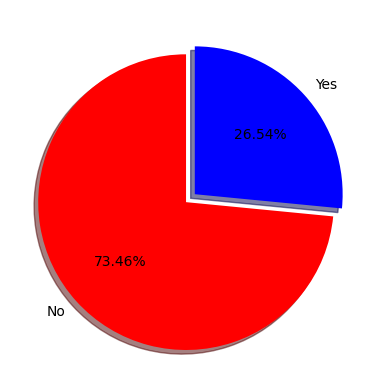

In [7]:
fig, ax = plt.subplots()
ax.pie(data["Churn"].value_counts(), labels=["No", "Yes"], autopct='%1.2f%%',
       colors=['red', 'blue'], shadow=True, explode=[0.08, 0.0], startangle=90)
plt.show()

We see pretty strong disbalance in our target classes. Perhaps in future we will need to do something with this. Some ML algorithms can be sensitive to such a problem

<a id="analysing-non-categorical-data"></a>
## 2. Analysing non-categorical data

<a id="non-categorical-histograms"><a>

## Histograms of MonthCharges, tenure and TotalCharges

Let's look at the histograms of our numerical features and think if they can tell us something.

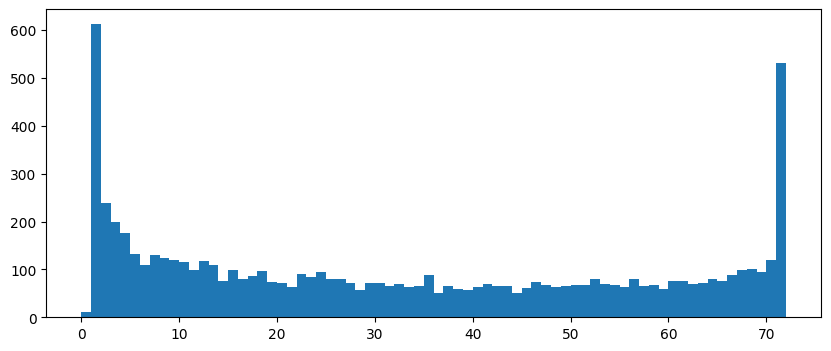

In [8]:
fig, ax = plt.subplots(figsize = (10,4))

ax.hist(data["tenure"], bins=72)
plt.show()

We see that the tenure feature is distributed nearly identically through the number of months from 0 to 72 except the "side values" which are closer to 72 and 0. There are many people in the data which are customers of the company only for 1 month and 72 month

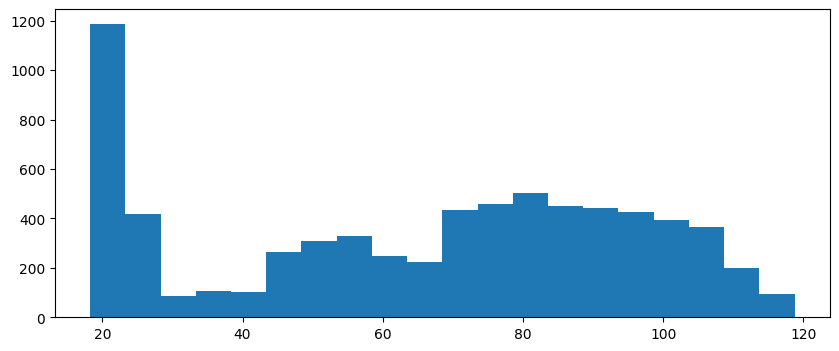

In [9]:
fig, ax = plt.subplots(figsize=(10, 4))

ax.hist(data["MonthlyCharges"], bins=20)
plt.show()

It can be just noticed that many customers use cheap services of the company

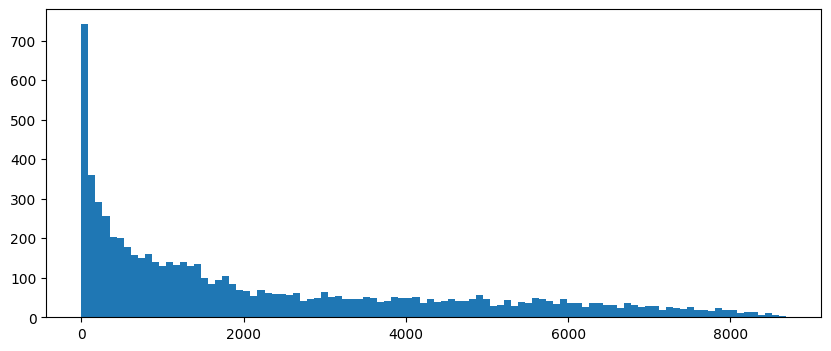

In [10]:
fig, ax = plt.subplots(figsize=(10, 4))

ax.hist(enc_data["TotalCharges"], bins=100)
plt.show()

It's pretty natural that such a feature will be ditributed as some kind of exponential distribution. This distribution can help us to answer the question "What is the probability that our customer will spend X money on us".

<a id="non-categorical-influence"><a>

## Influence of Churn on tenure, MonthCharges and TotalCharges distribution

Just looking at a single histogram tell us almost nothing. Let's look at some pair plots of the above variables with our target variable.

### TotalCharges

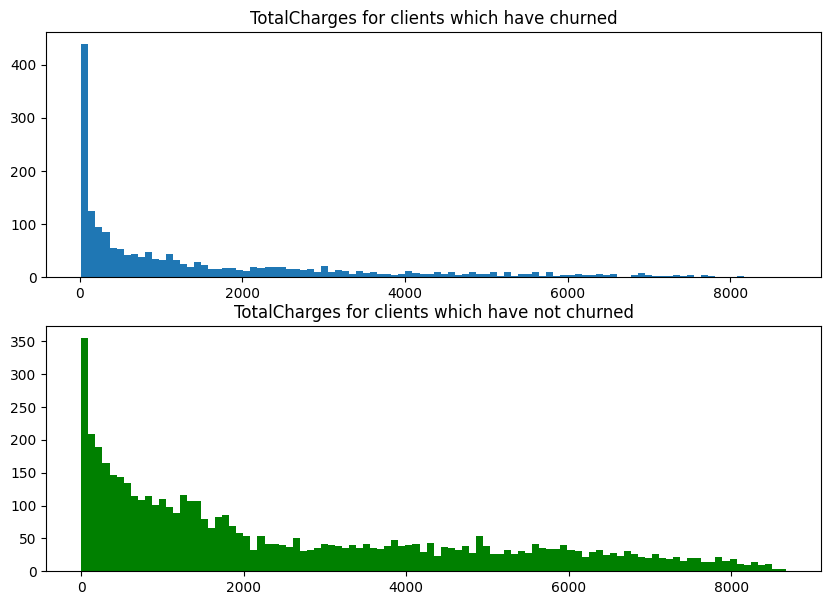

In [11]:
fig, ax = plt.subplots(2, 1, figsize=(10,7))

total_charges_churn = enc_data["TotalCharges"][data["Churn"] == "Yes"]
total_charges_no_churn = enc_data["TotalCharges"][data["Churn"] == "No"]

ax[0].hist(total_charges_churn, bins=100)
ax[0].set_title("TotalCharges for сlients which have churned")
ax[1].hist(total_charges_no_churn, bins=100, color="green")
ax[1].set_title("TotalCharges for сlients which have not churned")
plt.show()

Wee see the same behavior in distribution for both cases. The first histogram looks much smaller with not such high columns. The reason is that there is a disbalance in our data regarding our classes.

### tenure

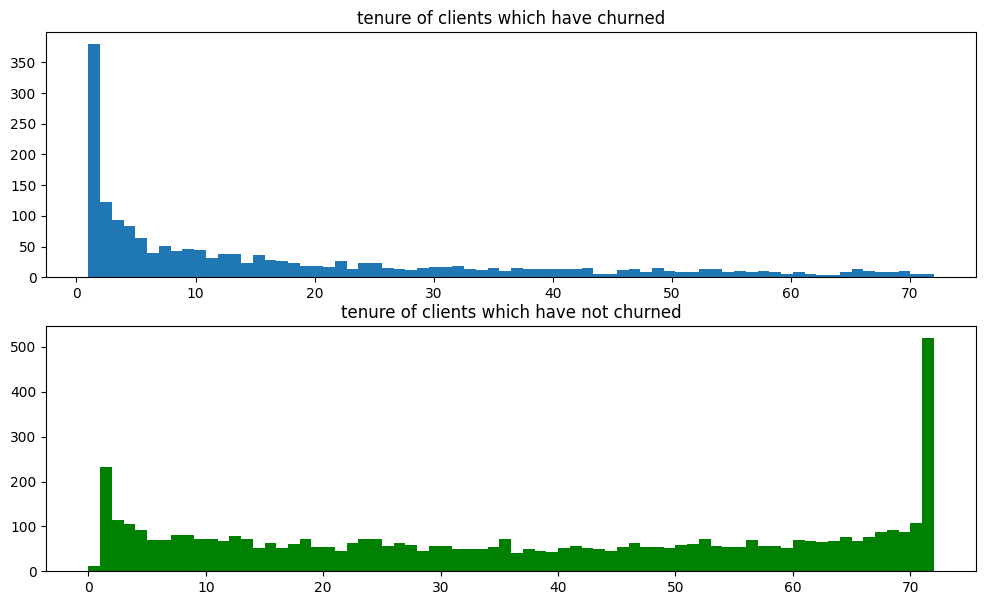

In [12]:
fig, ax = plt.subplots(2, 1, figsize=(12,7))

tenure_churn = enc_data["tenure"][data["Churn"] == "Yes"]
tenure_no_churn = enc_data["tenure"][data["Churn"] == "No"]

ax[0].hist(tenure_churn, bins=72)
ax[0].set_title("tenure of сlients which have churned")
ax[1].hist(tenure_no_churn, bins=72, color="green")
ax[1].set_title("tenure of clients which have not churned")
plt.show()

For the clients which have churned we can see that the longer the client stays the less the probability that he will churn. But of course we need to remember that there are class disbalance in our data.

On the other hand we see that not churned clients distributet through the tenure almost uniform except side-values

### MonthlyCharges

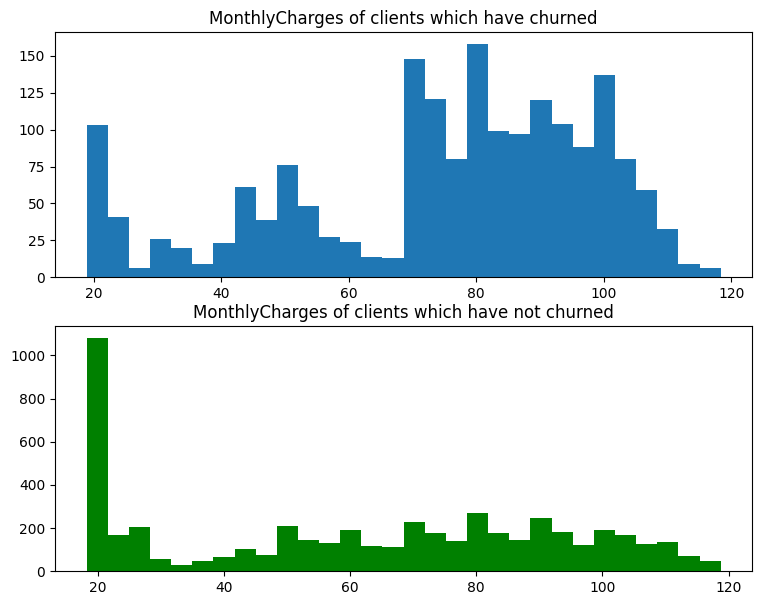

In [13]:
fig, ax = plt.subplots(2, 1, figsize=(9,7))

monthy_charges_churn = enc_data["MonthlyCharges"][data["Churn"] == "Yes"]
monthy_charges_no_churn = enc_data["MonthlyCharges"][data["Churn"] != "Yes"]

ax[0].hist(monthy_charges_churn, bins=30)
ax[0].set_title("MonthlyCharges of сlients which have churned")
ax[1].hist(monthy_charges_no_churn, bins=30, color="green")
ax[1].set_title("MonthlyCharges of clients which have not churned")
plt.show()

<a id="total-charges-statistical-hypotesis"></a>
### Statistical hypothesis about TotalCharges

As we said we have noticed that the feature TotalCharges seems to be exponential distributed. We can try to estimate parameter $\lambda$ from exponential distribution and look how the coresponding exponential pdf fits to our histogram. Also we can perform a Kolmogorov-Smirnov test to test our exponential hypothesis

Estimated mean: 2279.7343035638223
Estimated lambda: 0.0004386476083799493


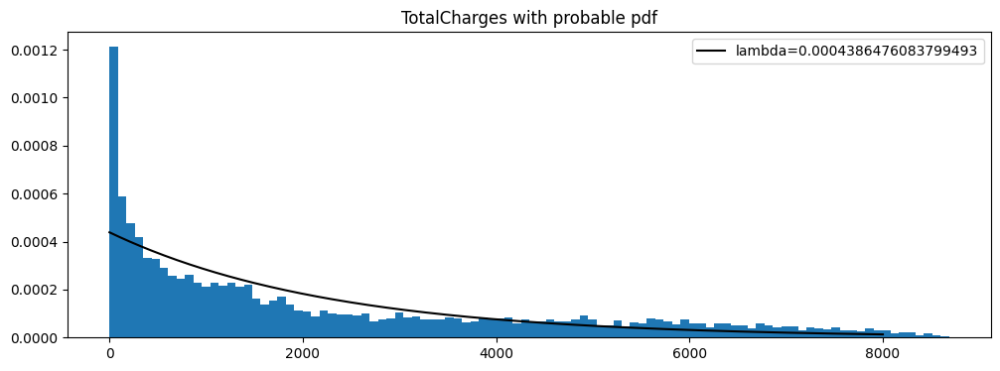

In [14]:
import scipy.stats as stats


TotalCharges_mean = enc_data["TotalCharges"].mean()

TotalCharges_lambda = 1 / TotalCharges_mean

print("Estimated mean:", TotalCharges_mean)
print("Estimated lambda:", TotalCharges_lambda)

fig, ax = plt.subplots(figsize=(12,4))

X = np.linspace(0, 8000, 300)

ax.hist(enc_data["TotalCharges"], bins=100, density=True)
ax.set_title("TotalCharges with probable pdf")
TotalCharges_expon_pdf = stats.expon.pdf(X, scale=TotalCharges_mean)

ax.plot(X, TotalCharges_expon_pdf, color="black", linewidth=1.5,
           label="lambda={}".format(TotalCharges_lambda))
ax.legend()

plt.show()

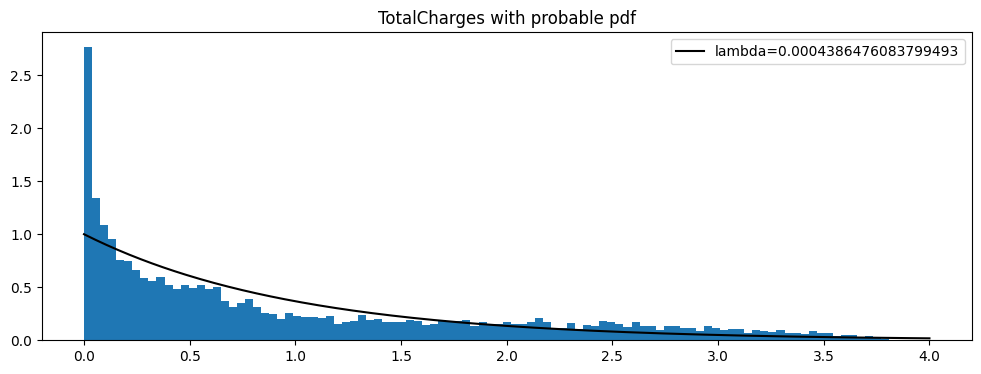

In [15]:
fig, ax = plt.subplots(figsize=(12,4))

X = np.linspace(0, 4, 300)

ax.hist(enc_data["TotalCharges"]*TotalCharges_lambda, bins=100, density=True)
ax.set_title("TotalCharges with probable pdf")
TotalCharges_expon_pdf = stats.expon.pdf(X)

ax.plot(X, TotalCharges_expon_pdf, color="black", linewidth=1.5,
           label="lambda={}".format(TotalCharges_lambda))
ax.legend()

plt.show()

We can already see that our "probable pdf" describes or data almost truerly except the customers which have spend not so much money on us. Let's see what the Kolmogorov-Smirnov test gives us if we suppose that our feature distributed exponentially with estimated lambda

In [16]:
result = kstest(enc_data["TotalCharges"]*TotalCharges_lambda, "expon")
result

KstestResult(statistic=0.09309926074658703, pvalue=1.4127304680498883e-53, statistic_location=0.15368018959591526, statistic_sign=1)

We refuse our exponential assumption (with particular $\lambda$) because pvalue is very small

<a id="analysing-categorical-data"></a>
# 3. Analysing categorical data

As a very usefull plot we can draw for each categorical variable histograms where each category will have two columns according to the count of of elements which have positive churn and negative so we can see how many churns in which category we have.

<a id="gender-seniorcitizen-partner-dependents"></a>
### gender, SeniorCitizen, Partner, Dependents

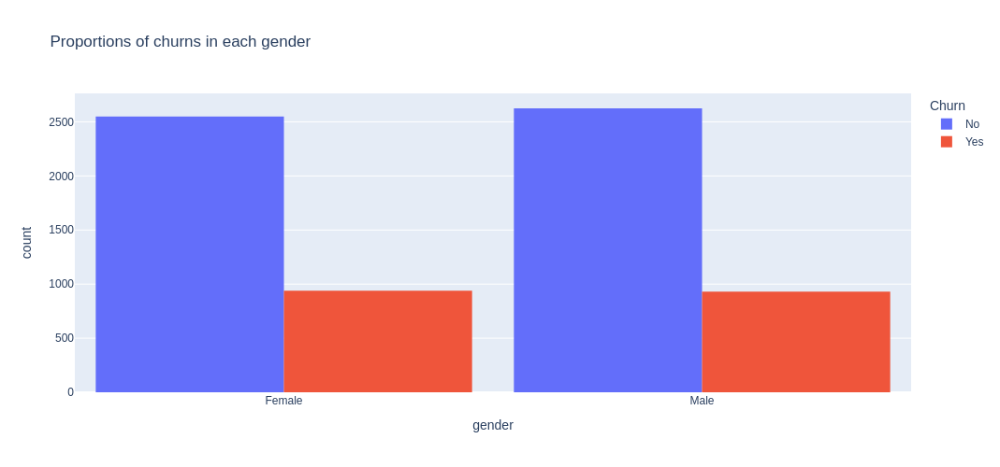

In [17]:
fig = px.histogram(data, x="gender", color="Churn", barmode="group", title="Proportions of churns in each gender")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

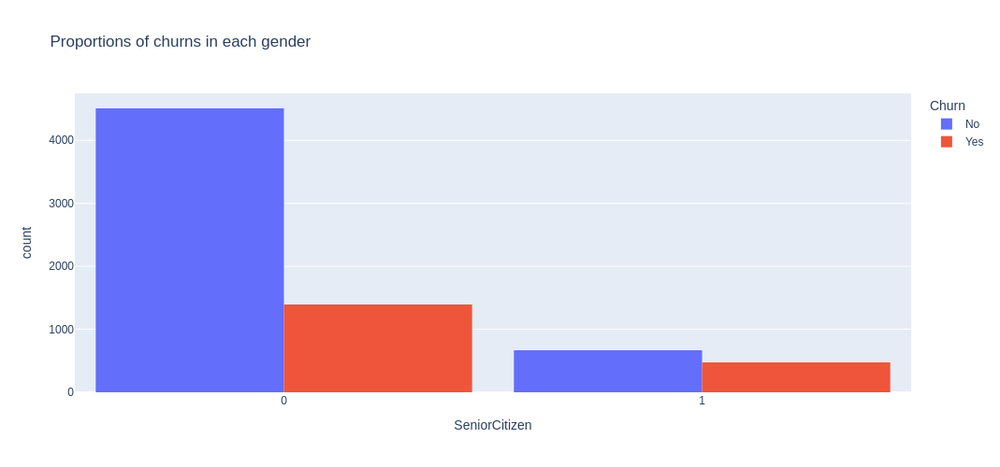

In [18]:
fig = px.histogram(data, x="SeniorCitizen", color="Churn", barmode="group", title="Proportions of churns in each gender")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

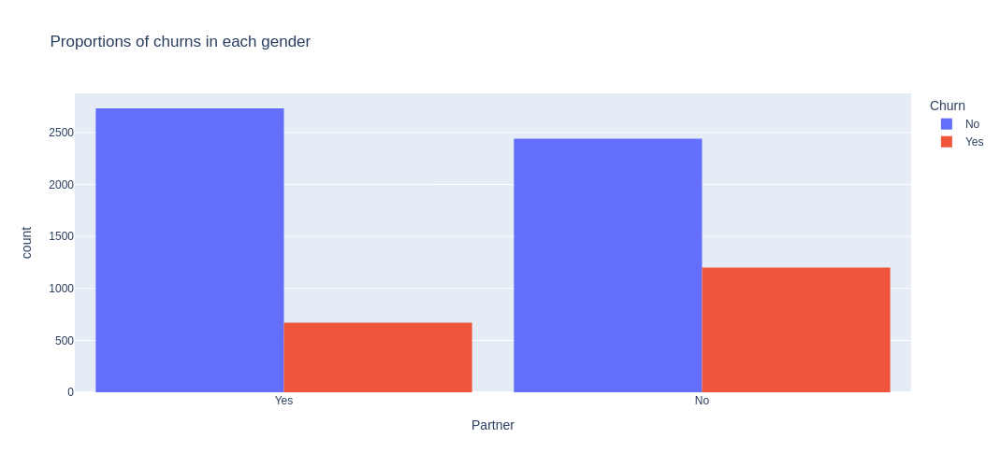

In [19]:
fig = px.histogram(data, x="Partner", color="Churn", barmode="group", title="Proportions of churns in each gender")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

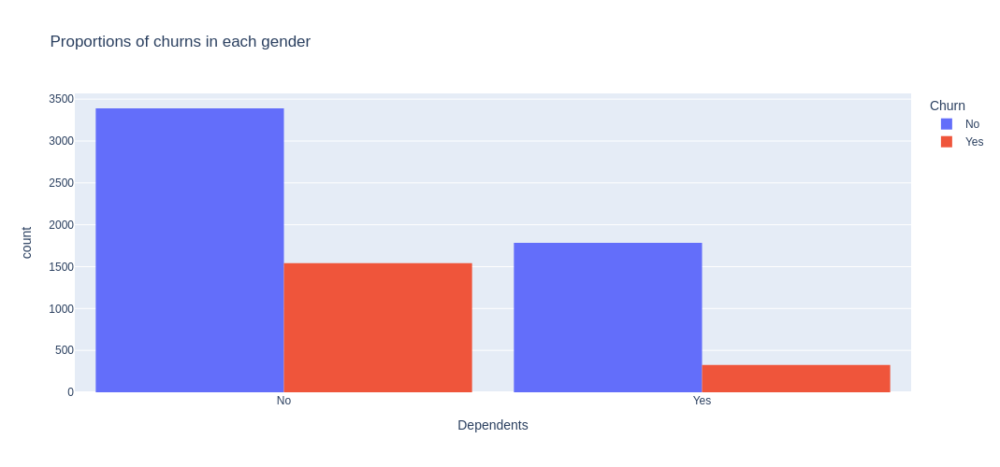

In [20]:
fig = px.histogram(data, x="Dependents", color="Churn", barmode="group", title="Proportions of churns in each gender")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

From the above histograms we can conclude that:

1. There is no disbalance in churning with respect to gender. Both men and women have the same probability to churn or not churn.<br><br>
2. Senior citizen are more likely to churn than young people. In Senior category almost half of clients have churned <br><br>
3. Customers which don't have partner are more likely to churn. Perhaps this is connected with the fact that if person lives not alone than the partner can be not satisfied and this can be the reason to churn<br><br>
4. Customers which have depends are less likely to churn.

<a id="phoneservice-multiple-lines-internetservice-onlinesecurity"></a>
### PhoneService MultipleLines InternetService OnlineSecurity

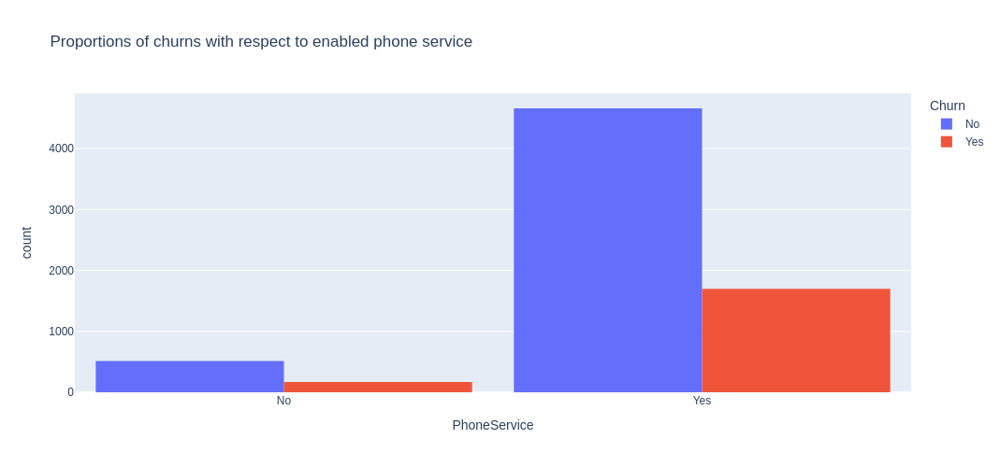

In [21]:
fig = px.histogram(data, x="PhoneService", color="Churn", barmode="group", title="Proportions of churns with respect to enabled phone service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

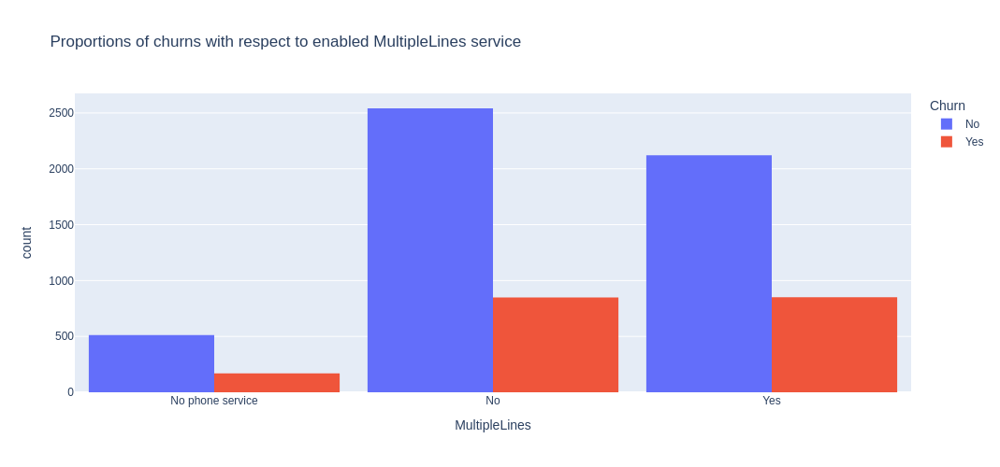

In [22]:
fig = px.histogram(data, x="MultipleLines", color="Churn", barmode="group", title="Proportions of churns with respect to enabled MultipleLines service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

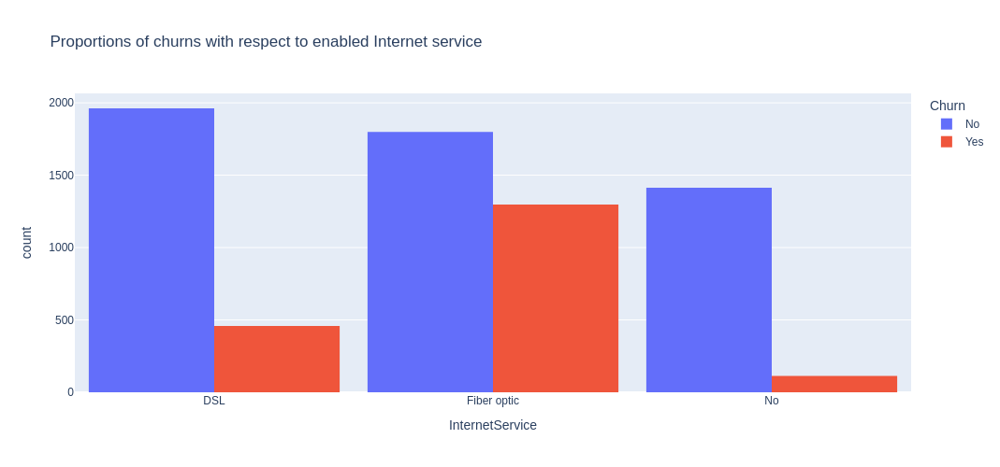

In [23]:
fig = px.histogram(data, x="InternetService", color="Churn", barmode="group", title="Proportions of churns with respect to enabled Internet service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

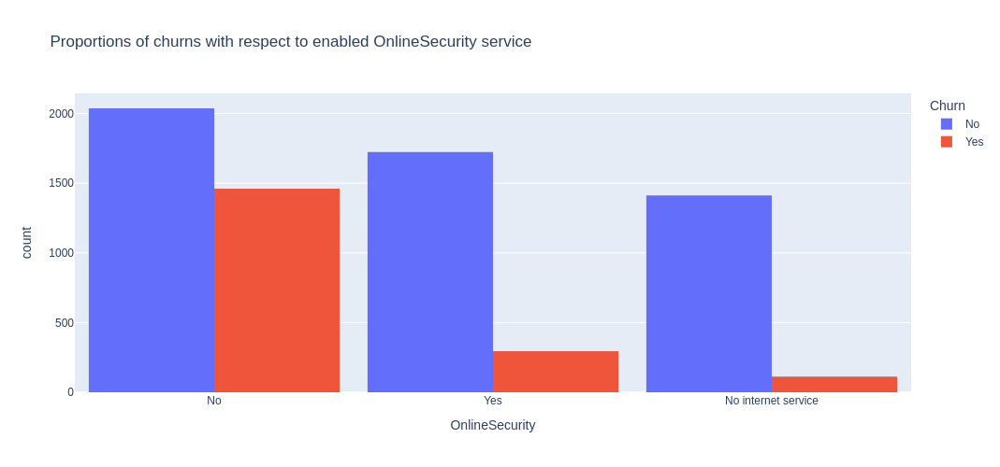

In [24]:
fig = px.histogram(data, x="OnlineSecurity", color="Churn", barmode="group", title="Proportions of churns with respect to enabled OnlineSecurity service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

From considered plots we can see that:

1. In the PhoneService feature there is no disbalance in the probability of churning<br><br>
2. With the MultipleLines the same situation<br><br>
3. Customers which have DSL Internet service are more likely tochurn that customers with fiber optic.<br><br>
4. Customers which have ordered OnlineSecurity are less likely to churn than customert which don't use such an option

<a id="onlinebackup-deviceprotection-techsupport-streaminv"></a>
### OnlineBackup DeviceProtection TechSupport StreamingTV

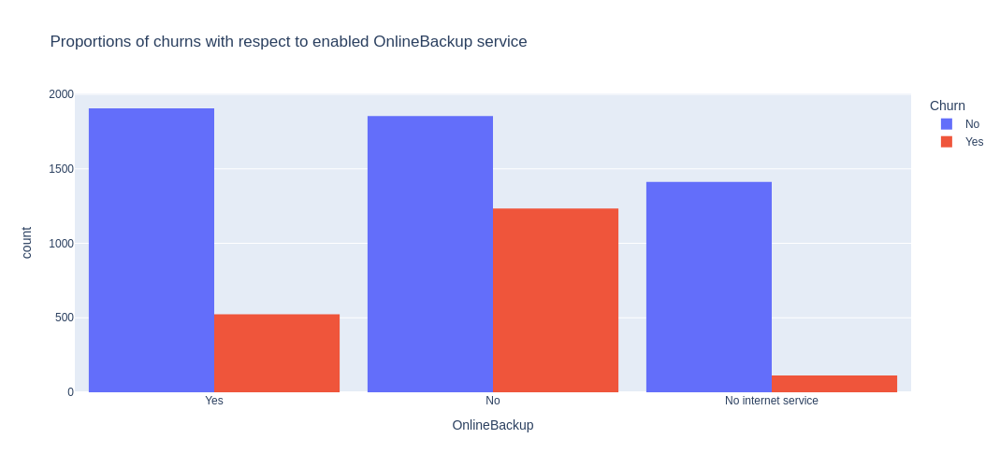

In [25]:
fig = px.histogram(data, x="OnlineBackup", color="Churn", barmode="group", title="Proportions of churns with respect to enabled OnlineBackup service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

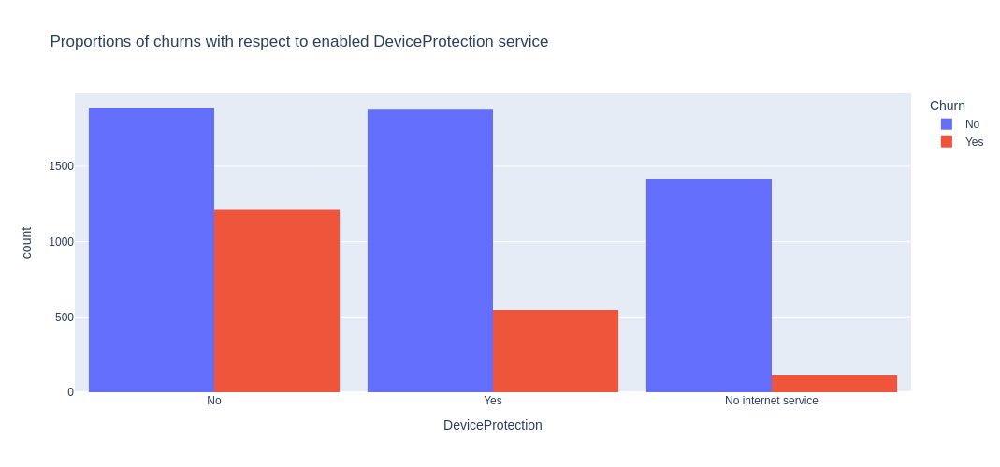

In [26]:
fig = px.histogram(data, x="DeviceProtection", color="Churn", barmode="group", title="Proportions of churns with respect to enabled DeviceProtection service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

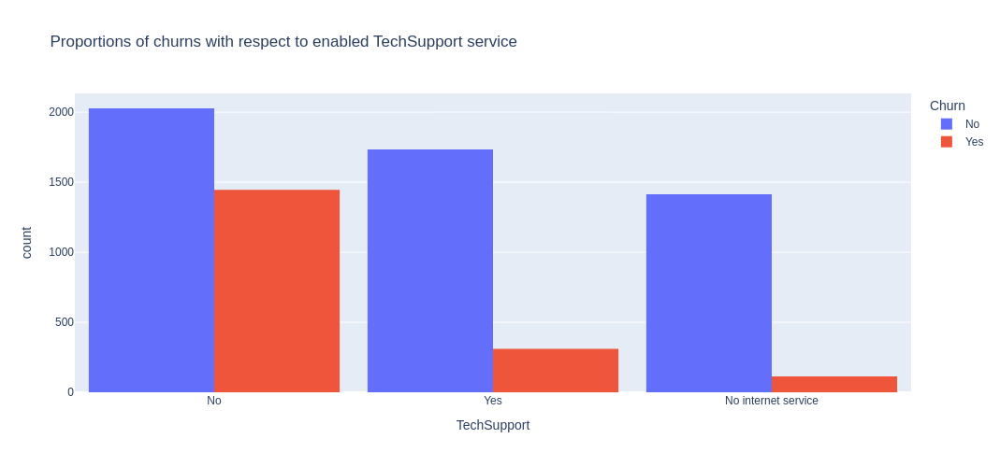

In [27]:
fig = px.histogram(data, x="TechSupport", color="Churn", barmode="group", title="Proportions of churns with respect to enabled TechSupport service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

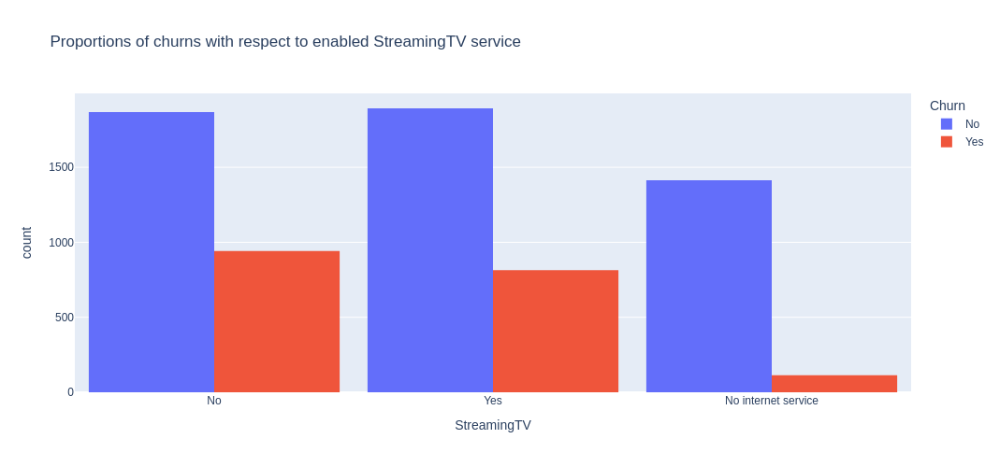

In [28]:
fig = px.histogram(data, x="StreamingTV", color="Churn", barmode="group", title="Proportions of churns with respect to enabled StreamingTV service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

About these features we can say:

1. Customers which have no online backup are more likely to churn than customers which have it<br><br>
2. Customers which have device protection option are less likely to churn than those who not<br><br>
3. Customers which have Tech support option are less likely to churn than those who not<br><br>
4. It almost doesn't matter if customer has StreamingTV option. The probabilities to churn are almost the same

<a id="streamingmovies-contract-paperlessbilling-paymentmethod"></a>
### StreamingMovies Contract PaperlessBilling PaymentMethod

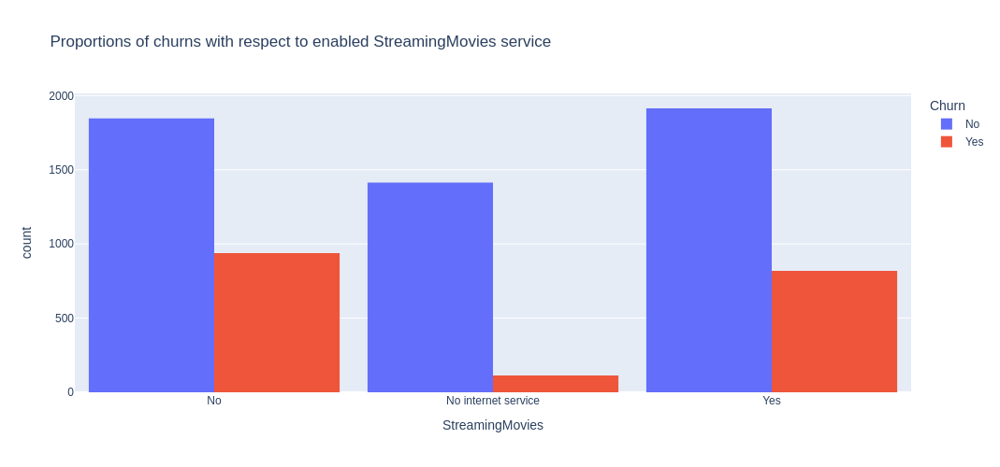

In [29]:
fig = px.histogram(data, x="StreamingMovies", color="Churn", barmode="group", title="Proportions of churns with respect to enabled StreamingMovies service")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

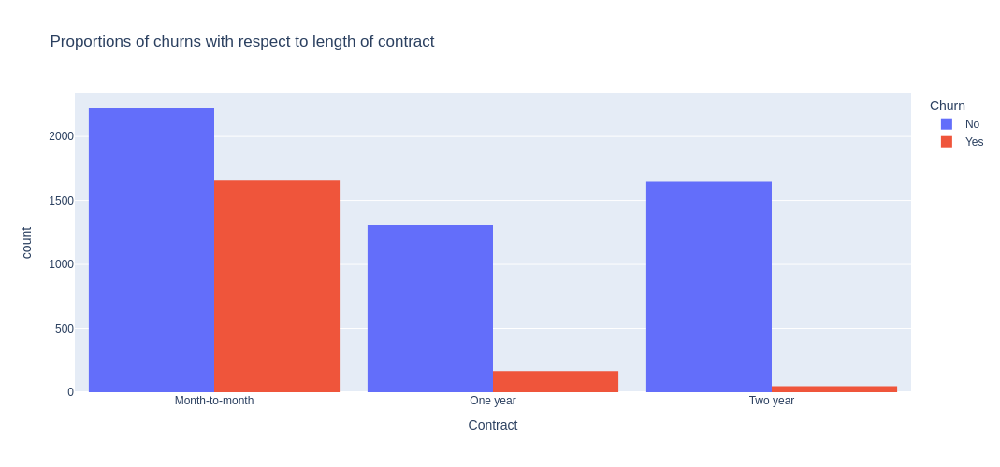

In [30]:
fig = px.histogram(data, x="Contract", color="Churn", barmode="group", title="Proportions of churns with respect to length of contract")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

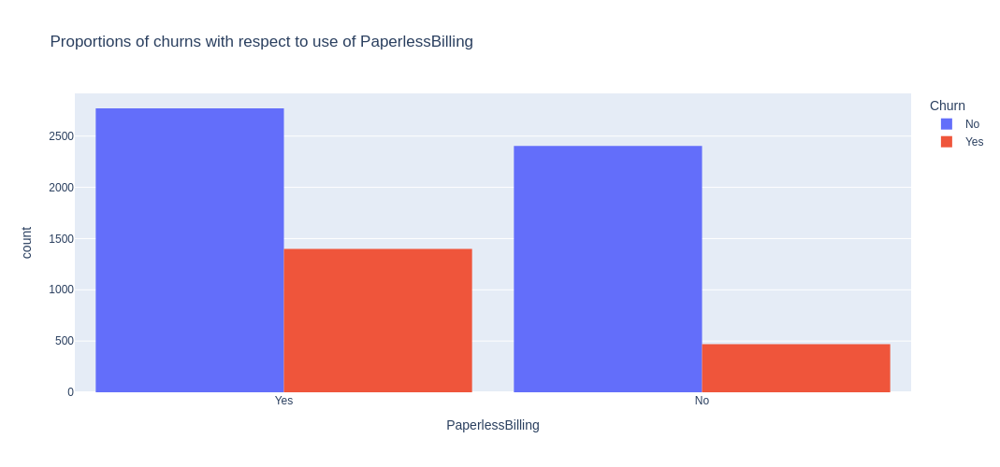

In [31]:
fig = px.histogram(data, x="PaperlessBilling", color="Churn", barmode="group", title="Proportions of churns with respect to use of PaperlessBilling")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

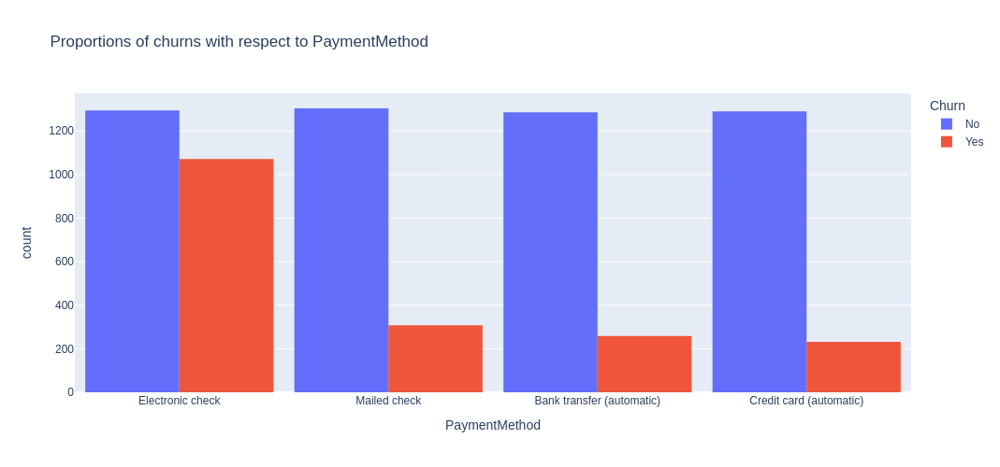

In [32]:
fig = px.histogram(data, x="PaymentMethod", color="Churn", barmode="group", title="Proportions of churns with respect to PaymentMethod")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

It is visible to the naked eye that:

1. Using of streaming movies service does not affect probability of churn<br><br>
2. Customers who use long-term contracts (one or two years) are less likely to churn than customers who pay month-to-month<br><br>
3. Customers who use paperless billing are more likely to churn<br><br>
4. Among all payment methods electronic check has the largest churning rate.

<a id="#correlations"></a>
## Correlations between variables

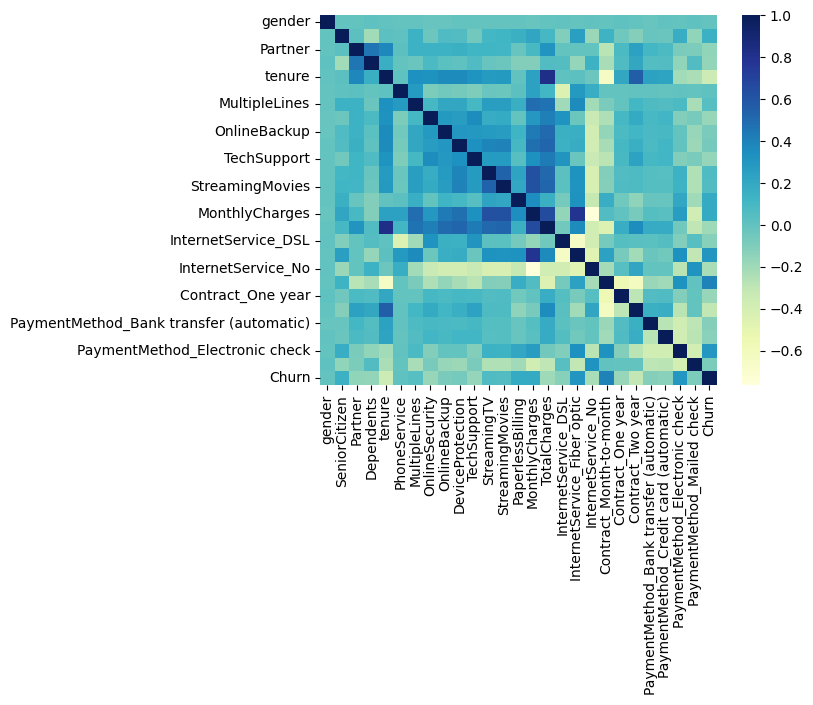

In [36]:
import seaborn as sb

dataplot = sb.heatmap(enc_data.drop("customerID", axis=1).corr(),
                      cmap="YlGnBu")

plt.show()

<a id="pca"></a>
## Data visualization with PCA

In [38]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

np.set_printoptions(suppress=True, precision=3)


pca = PCA(n_components = 10)
scaler = StandardScaler()

enc_train_X = enc_data.drop(["Churn", "customerID"], axis=1)
enc_train_Y = enc_data["Churn"]

X_scaled = scaler.fit_transform(enc_train_X)
X_reduced = pca.fit_transform(X_scaled)

print("EXPLAINED VARIANCE", pca.explained_variance_)
print("EXPLAINED VARIANCE RATIO", pca.explained_variance_ratio_)
print("FIRST THREE DIMENSION EXPLAINED VARIANCE", pca.explained_variance_ratio_[:3].sum())

EXPLAINED VARIANCE [5.578 3.683 2.239 1.324 1.28  1.227 1.156 1.025 0.994 0.917]
EXPLAINED VARIANCE RATIO [0.215 0.142 0.086 0.051 0.049 0.047 0.044 0.039 0.038 0.035]
FIRST THREE DIMENSION EXPLAINED VARIANCE 0.4422541260807876


In [39]:
X_reduced_df = pd.DataFrame(X_reduced, columns=["pc{}".format(i) for i in range(1, 11)])
X_reduced_df["Churn"] = data["Churn"]

We see that the first 3 principal component describe almost half of the whole Variance. Let's display them one by one

<a id="pca_one_dimension"></a>
## One Dimension

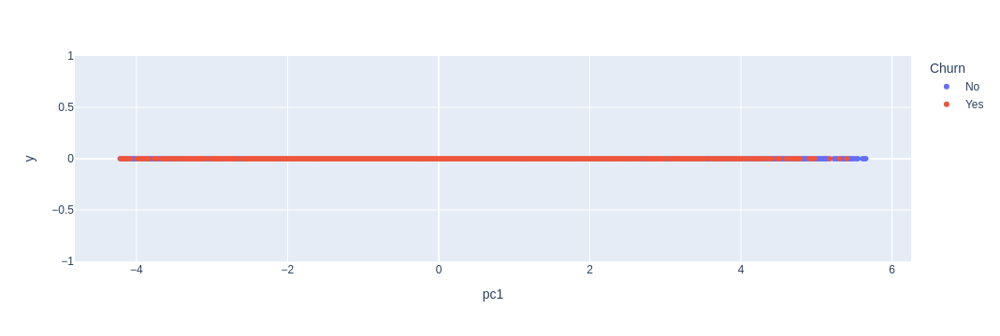

In [40]:
fig = px.scatter(X_reduced_df, x="pc1", y=[0 for i in range(X_reduced.shape[0])],
                color="Churn")
fig.show()

<a id="pca_two_dimensions"></a>
## Two Dimensions

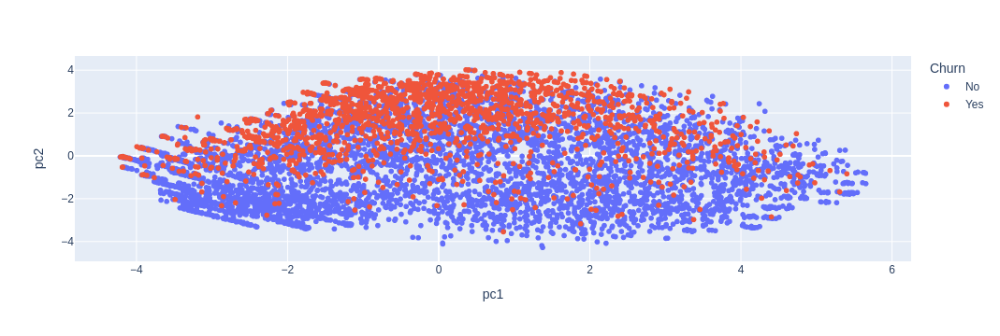

In [41]:
fig = px.scatter(X_reduced_df, x="pc1", y="pc2", color="Churn")
fig.show()

We see even for two dimension case that there are two obvious groups which are not chaotic. Area with red dots which mean that the customer churned locates higher than the area with blue dots

<a id="pca_three_dimensions"></a>
## Three Dimensions

In [42]:
fig = px.scatter_3d(X_reduced_df, x="pc1", y="pc2", z="pc3", color="Churn")
fig.update_traces(marker_size = 2)
fig.show()

In [45]:
fig = px.scatter_3d(X_reduced_df, x="pc1", y="pc2", z="pc4", color="Churn")
fig.update_traces(marker_size = 2)
fig.show()

In [46]:
fig = px.scatter_3d(X_reduced_df, x="pc1", y="pc2", z="pc5", color="Churn")
fig.update_traces(marker_size = 2)
fig.show()